<a href="https://colab.research.google.com/github/AhmedAbdallah142/Computer-Vision/blob/main/Image_Mosaics_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.interpolate import RectBivariateSpline
import random
import math

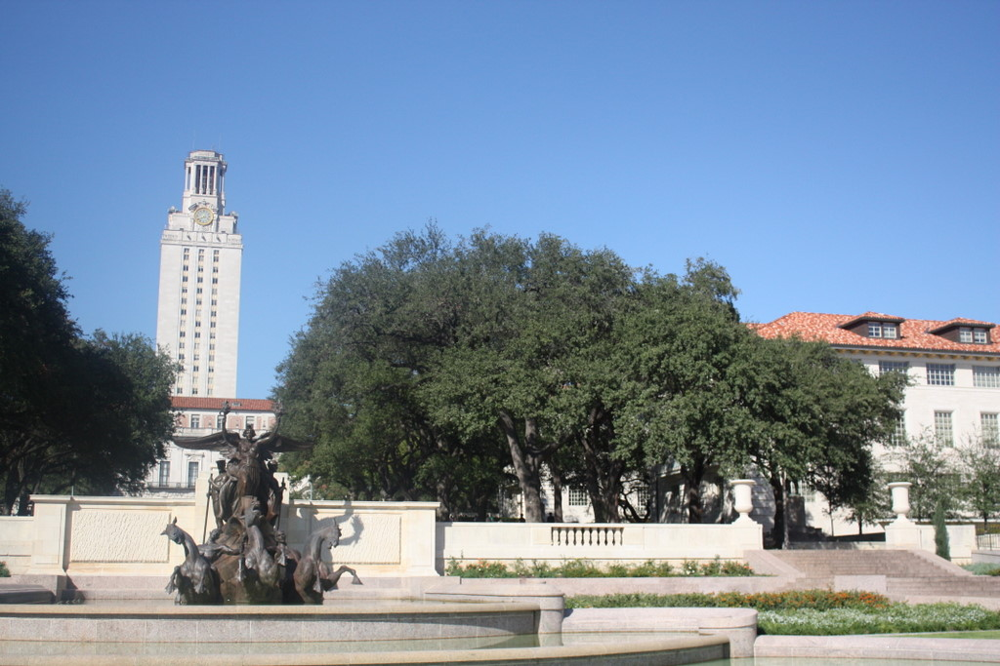





--------------------------------------------------------






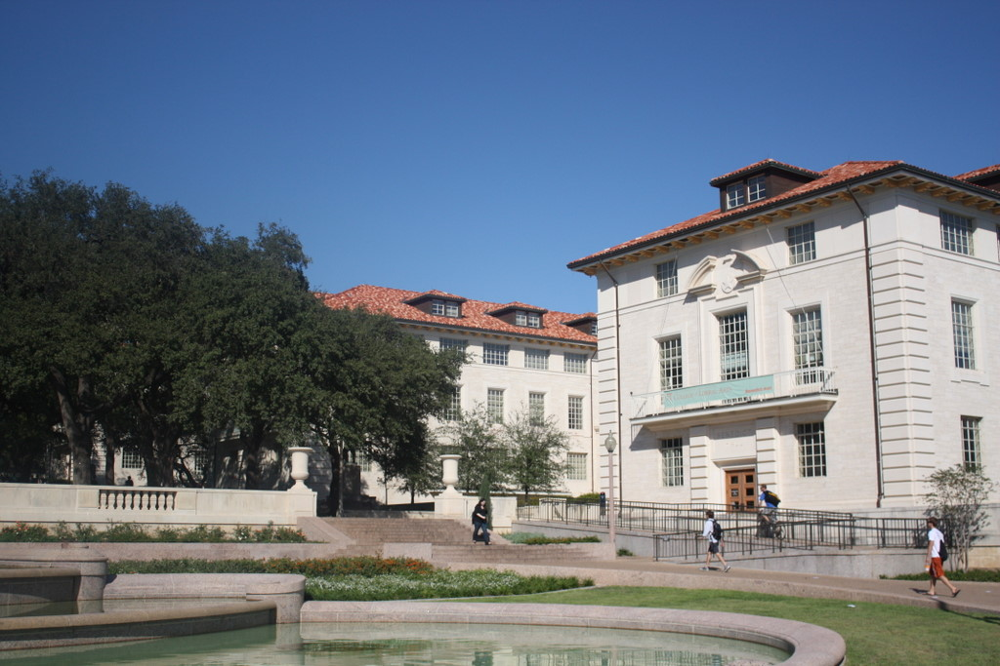

In [ ]:
img1 = cv2.imread('image1.jpg',cv2.COLOR_BGR2RGB)
img2 = cv2.imread('image2.jpg',cv2.COLOR_BGR2RGB)
cv2_imshow(img1)
print("\n\n\n\n--------------------------------------------------------\n\n\n\n")
cv2_imshow(img2)

In [ ]:
def SIFT_descriptor(img1,img2):
  sift = cv2.xfeatures2d.SIFT_create()

  keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)
  return keypoints_1,keypoints_2,descriptors_1,descriptors_2

In [ ]:
def get_Correspondences(descriptors_1,descriptors_2):
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(descriptors_1,descriptors_2,k=2)
  # Apply ratio test
  good = []
  for m,n in matches:
      if m.distance < 0.75*n.distance:
          good.append([m])
  return good

In [ ]:
def Homography_RANSAC(src, dest,p=0.99,threshold=10):
	N = np.inf
	sample_count = 0
	max_num_inliers = 0
	while N > sample_count:
	# choose 4 random points from src pts
		r = np.random.choice(len(src), 4)
		random_pts_1 = np.asarray([src[i] for i in r], dtype=np.float32)
		random_pts_2 = np.asarray([dest[i] for i in r], dtype=np.float32)
	# compute H matrix for chosen points
		H = computeH(random_pts_1, random_pts_2)
	# count the number of inliers
		inlier_count = 0
		for p1, p2 in zip(src, dest):#for every two corresponding points
			# Convert to homogeneous coordinates   p = [x y 1]T
			p_homogeneous = (np.append(p1, 1)).reshape(3, 1) 
			# Multiply by the homography matrix    p' = H.P
			p_dash = H @ p_homogeneous
			# Convert back to heterogeneous coordinates   p' = [x' y' w']T   =>  p'=[x'/w'  y'/w']T
			p_dash = (p_dash/p_dash[2])[:2].reshape(1, 2)
			# calculate euclidean distance between the actual and calculated points 
			if cv2.norm(p2 - p_dash) <= threshold:
				inlier_count += 1
		
	# choose the model that has the largest number of inliers.
		if inlier_count > max_num_inliers:  
			max_num_inliers = inlier_count
			bestH = H

		inlier_ratio = inlier_count / len(dest)
		if np.log(1 - (inlier_ratio**8)) == 0:
			continue
		
		N = np.log(1-p) / np.log(1 - (inlier_ratio**8))
		sample_count += 1
	return bestH

def computeH(src, dest):
	A = []
	for i in range(len(src)):
		x1, y1 = src[i][0], src[i][1]
		x2, y2 = dest[i][0], dest[i][1]
		A.append([x1, y1, 1, 0, 0, 0, -x1 * x2, -x2 * y1, -x2])
		A.append([0, 0 , 0, x1, y1, 1, -y2 * x1, -y1 * y2, -y2])
	
	_, _, V_t = np.linalg.svd(np.array(A))
	H = np.reshape(V_t[-1, :], (3, 3))
	return H/H[2,2]

In [ ]:
def get_built_in_homography_matrix(keypoints_1,keypoints_2,good):
  src_pts = np.float32([ keypoints_1[m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)
  dst_pts = np.float32([ keypoints_2[m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)
  H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
  return H

In [ ]:
def get_homography_matrix(keypoints_1,keypoints_2,good):
  src=[]
  for x in keypoints_1:
    src.append([x.pt[0] , x.pt[1]])
  src = np.asarray(src)

  dest=[]
  for x in keypoints_2:
    dest.append([x.pt[0] , x.pt[1]])
  dest = np.asarray(dest)

  matchesPos=[]
  for x in good:
    matchesPos.append([x[0].queryIdx , x[0].trainIdx])
  matchesPos = np.asarray(matchesPos)
  return Homography_RANSAC(src[matchesPos[:, 0]],dest[matchesPos[:, 1]])

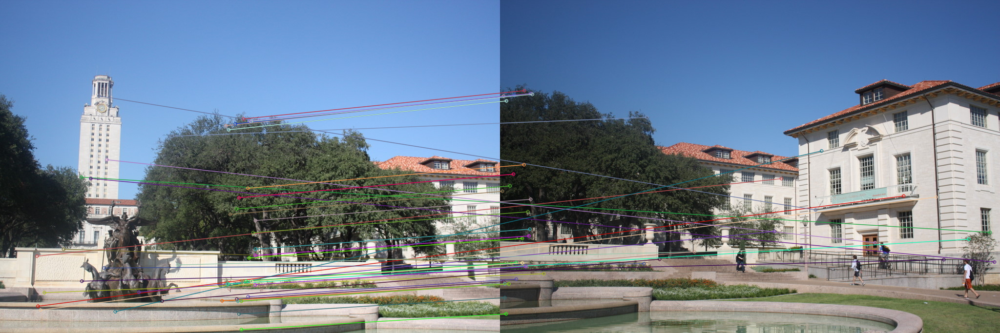

In [ ]:
keypoints_1,keypoints_2,descriptors_1,descriptors_2 = SIFT_descriptor(img1,img2)
good = get_Correspondences(descriptors_1,descriptors_2)
# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(img1,keypoints_1,img2,keypoints_2,good[0:50],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(img3)

In [ ]:
print("built in homography matrix:")
print(get_built_in_homography_matrix(keypoints_1,keypoints_2,good))
print("\nimplemented homography matrix:")
H = get_homography_matrix(keypoints_1,keypoints_2,good)
print(H)

built in homography matrix:
[[ 1.29732753e+00 -7.40138501e-02 -5.73339373e+02]
 [ 1.69097304e-01  1.21963808e+00 -1.67886448e+02]
 [ 2.78650500e-04  2.13735909e-05  1.00000000e+00]]

implemented homography matrix:
[[ 1.28490418e+00 -7.37929671e-02 -5.68352464e+02]
 [ 1.62160334e-01  1.20834746e+00 -1.61887242e+02]
 [ 2.58718070e-04  3.40317558e-05  1.00000000e+00]]


In [ ]:
from math import inf, ceil, floor
def point(y, x):
  return np.array([x,y,1]).reshape((3, 1))

def transform(point,H):
  P = H @ point
  P = P / P[2]
  return P		

def warpPerspective(img, H):
  # note the first index of image is y
  height = img.shape[0]
  width = img.shape[1]

  boundaries = np.array([[0,0],[height-1, 0],[0, width-1],[height-1, width-1]])
  minX, minY, maxX, maxY = (inf, inf, -inf, -inf)
  for b in boundaries:
    P = transform(point(b[0],b[1]),H)
    minX, minY = (min(minX, P[0].item()), min(minY, P[1].item()))
    maxX, maxY = (max(maxX, P[0].item()), max(maxY, P[1].item()))

  warpedImg = np.zeros((ceil(maxY - minY), ceil(maxX - minX), 3), dtype=np.uint8)
  for y in range(img.shape[0]):
     for x in range(img.shape[1]):
       P = transform(point(y,x),H)
       warpedImg[int(P[1] - minY), int(P[0] - minX)] = img[y, x]
  
  shiftX,shiftY=minX,minY
  return warpedImg,shiftX,shiftY

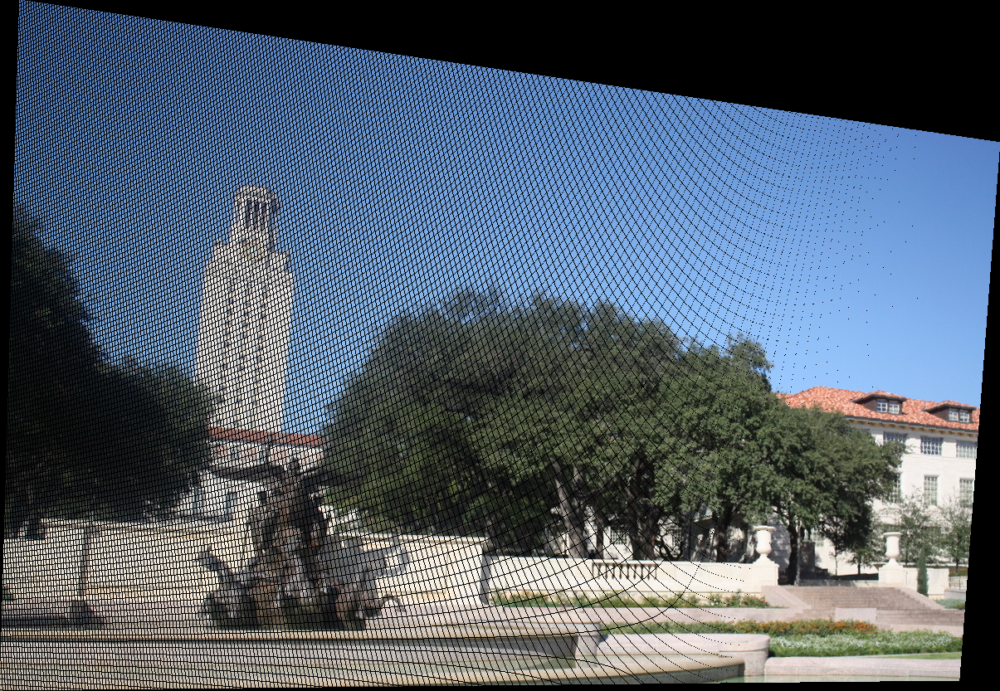

In [ ]:
(wraped_image,shiftX,shiftY) = warpPerspective(img1,H)
cv2_imshow(wraped_image)

In [ ]:
def Bilinear_interpolation(img, x, y):
  h, w, _ = img.shape
  minY, maxY = (floor(y), ceil(y))
  minX, maxX = (floor(x), ceil(x))

  result = 0

  if minY >= 0 and minY < h and minX >= 0 and minX < w:
    result+= ((1 - abs(y - minY)) * (1 - abs(x - minX)) * img[minY,minX , :])
  
  if minY >= 0 and minY < h and maxX >= 0 and maxX < w:
    result+= ((1 - abs(y - minY)) * (1 - abs(x - maxX)) * img[minY,maxX , :])

  if maxY >= 0 and maxY < h and minX >= 0 and minX < w:
    result+= ((1 - abs(y - maxY)) * (1 - abs(x - minX)) * img[maxY,minX , :])

  if maxY >= 0 and maxY < h and maxX >= 0 and maxX < w:
    result+= ((1 - abs(y - maxY)) * (1 - abs(x - maxX)) * img[maxY,maxX , :])

  return result


In [ ]:
def remove_holes(warpedImg,H,img,shiftX,shiftY):
  H_inv = np.linalg.inv(H)

  index =np.where(warpedImg[:,:,0]==0)
  for i in range(len(index[0])):
    y=index[0][i]
    x=index[1][i]
    P = transform(point( y + shiftY, x + shiftX),H_inv ) 
    P.reshape(-1)
    warpedImg[y, x, :] = Bilinear_interpolation(img, P[0], P[1])
    
  if warpedImg.shape[2] == 1:
    warpedImg = warpedImg.reshape(warpedImg.shape[0], -1)
  
  return warpedImg

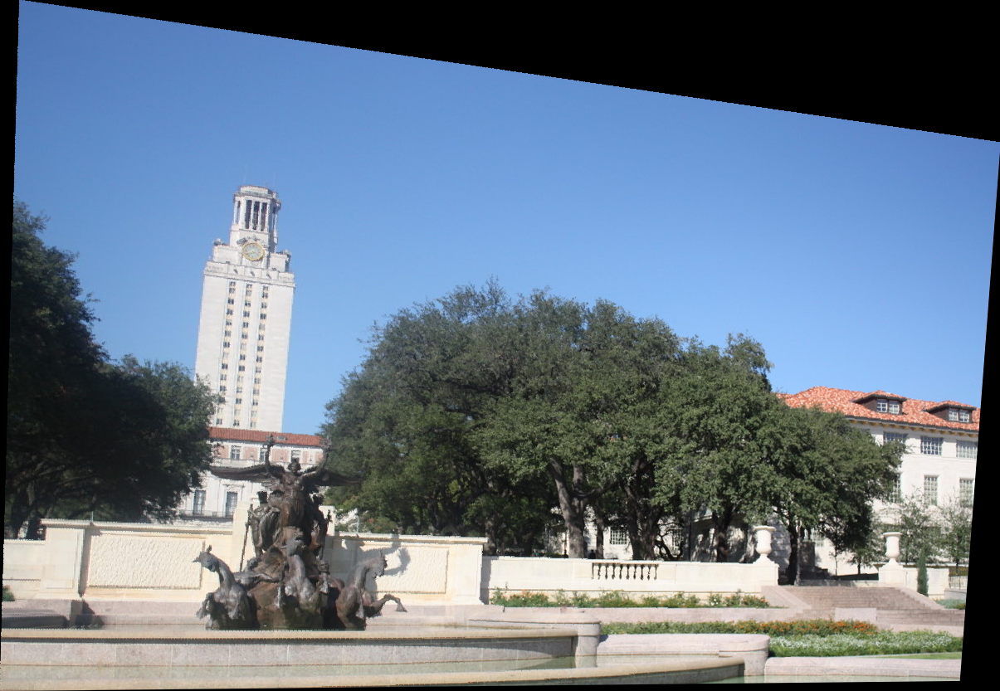

In [ ]:
wraped_image=remove_holes(wraped_image,H,img1,shiftX,shiftY)
cv2_imshow(wraped_image)

In [ ]:
def create_mosaic(wraped_image,img,shiftX,shiftY):
  height = max(ceil(img.shape[0] - shiftY), ceil(wraped_image.shape[0] + shiftY))
  width =  max(ceil(img.shape[1] - shiftX), ceil(wraped_image.shape[1] + shiftX))
  
  image = np.zeros((height, width, 3), dtype=np.uint8)

  wrap_shiftX,wrap_shiftY = max(0, round(shiftX)), max(0, round(shiftY))
  img_shiftX,img_shiftY = max(0, round(-shiftX)), max(0, round(-shiftY))

  image[wrap_shiftY:wrap_shiftY+wraped_image.shape[0], wrap_shiftX:wrap_shiftX+wraped_image.shape[1]] = wraped_image
  image[img_shiftY:img_shiftY+img.shape[0], img_shiftX:img_shiftX+img.shape[1]] = img

  return image

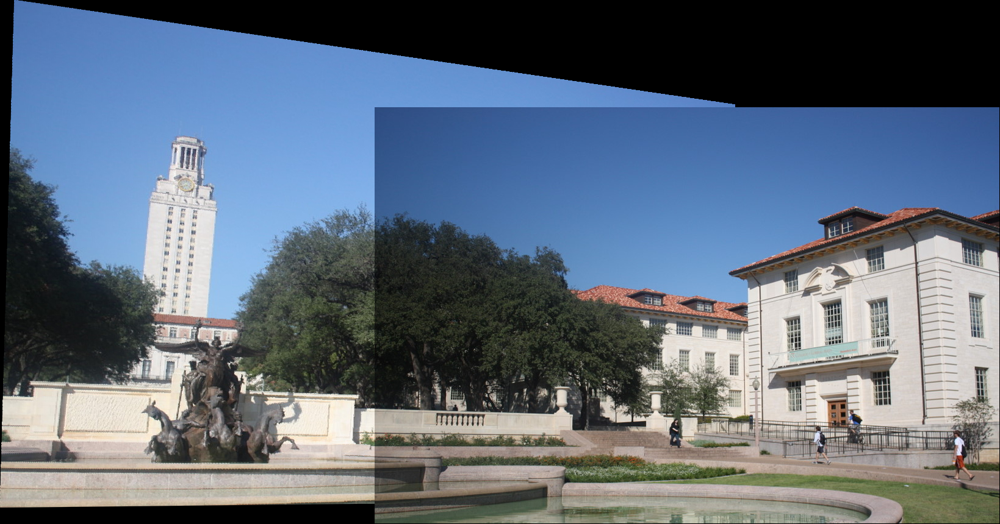

In [ ]:
result = create_mosaic(wraped_image ,img2, shiftX, shiftY)
cv2_imshow(result)

In [ ]:
def stitch_images(img1, img2):
  keypoints_1,keypoints_2,descriptors_1,descriptors_2 = SIFT_descriptor(img1,img2)
  good = get_Correspondences(descriptors_1,descriptors_2)
  H = get_homography_matrix(keypoints_1,keypoints_2,good)
  (wraped_image,shiftX,shiftY) = warpPerspective(img1,H)
  wraped_image=remove_holes(wraped_image,H,img1,shiftX,shiftY)
  result = create_mosaic(wraped_image ,img2, shiftX, shiftY)
  return result

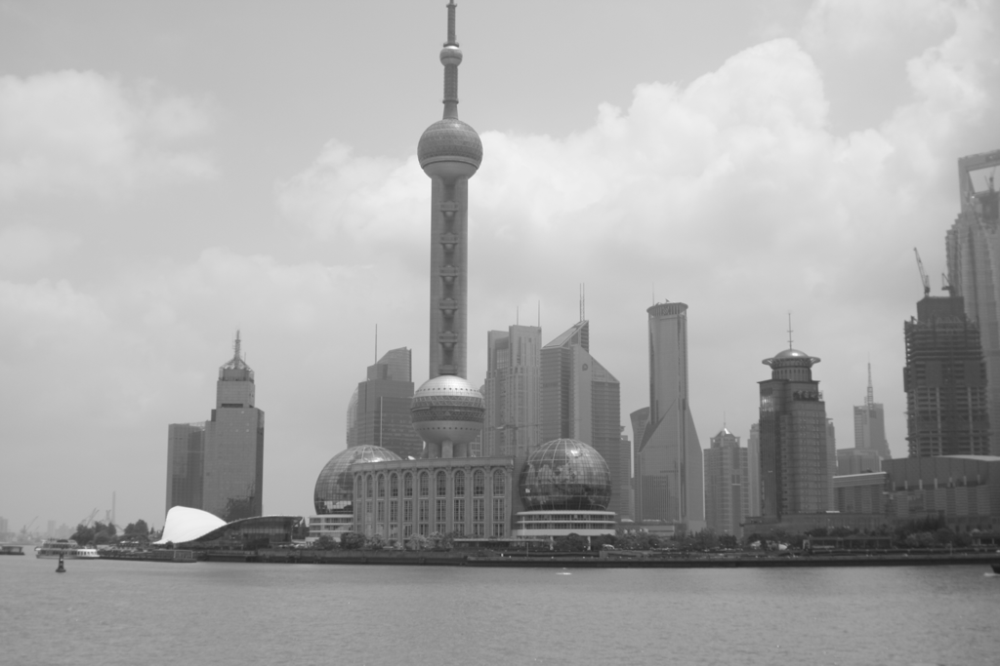





--------------------------------------------------------






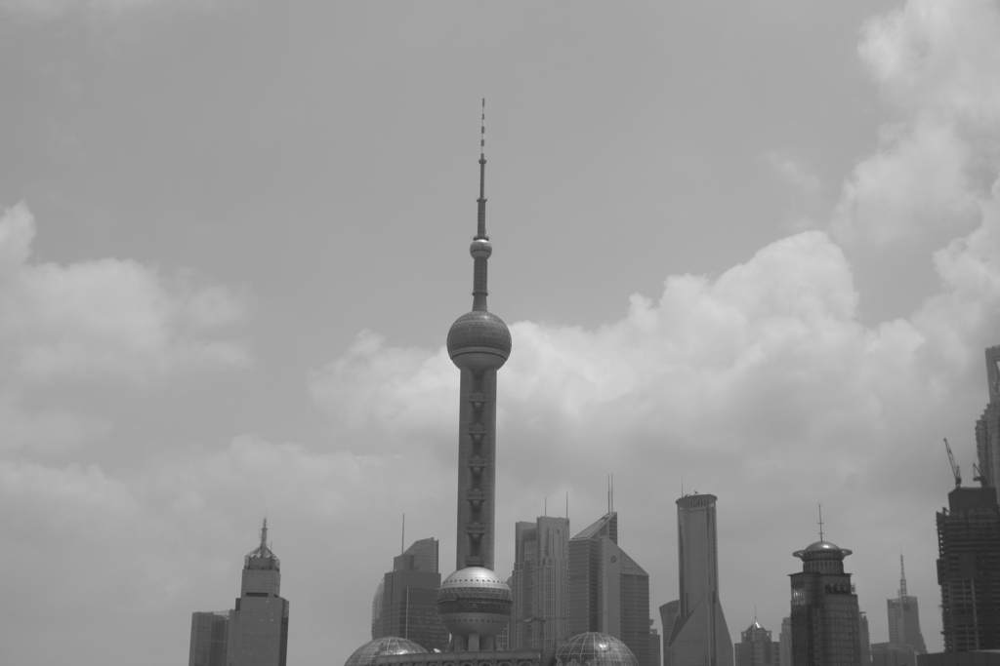





--------------------------------------------------------






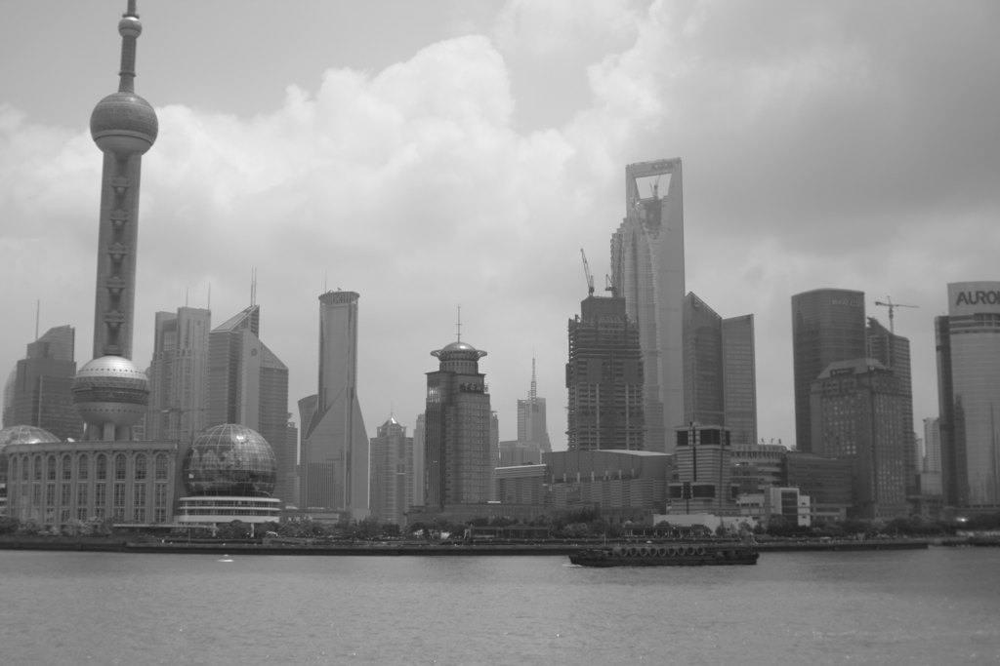

In [ ]:
bouns_img_1 = cv2.imread('shanghai-21.png')
bouns_img_2 = cv2.imread('shanghai-22.png')
bouns_img_3 = cv2.imread('shanghai-23.png')
cv2_imshow(bouns_img_1)
print("\n\n\n\n--------------------------------------------------------\n\n\n\n")
cv2_imshow(bouns_img_2)
print("\n\n\n\n--------------------------------------------------------\n\n\n\n")
cv2_imshow(bouns_img_3)

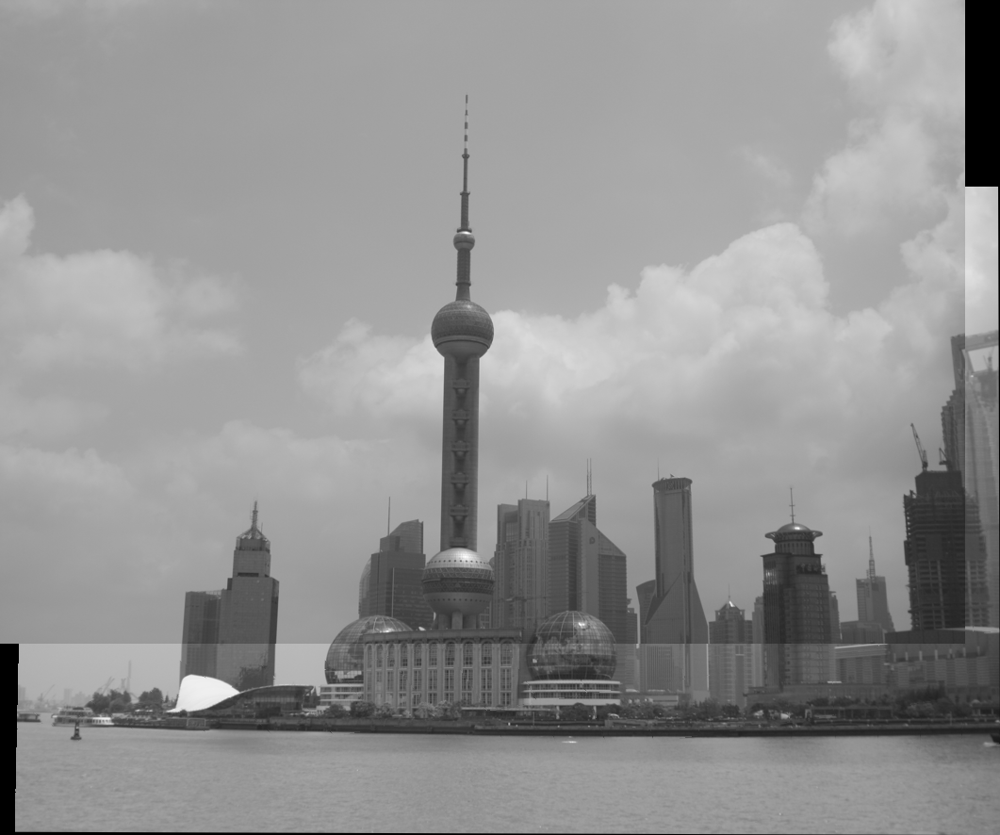

In [ ]:
out1 = stitch_images(bouns_img_1, bouns_img_2)
cv2_imshow(out1)

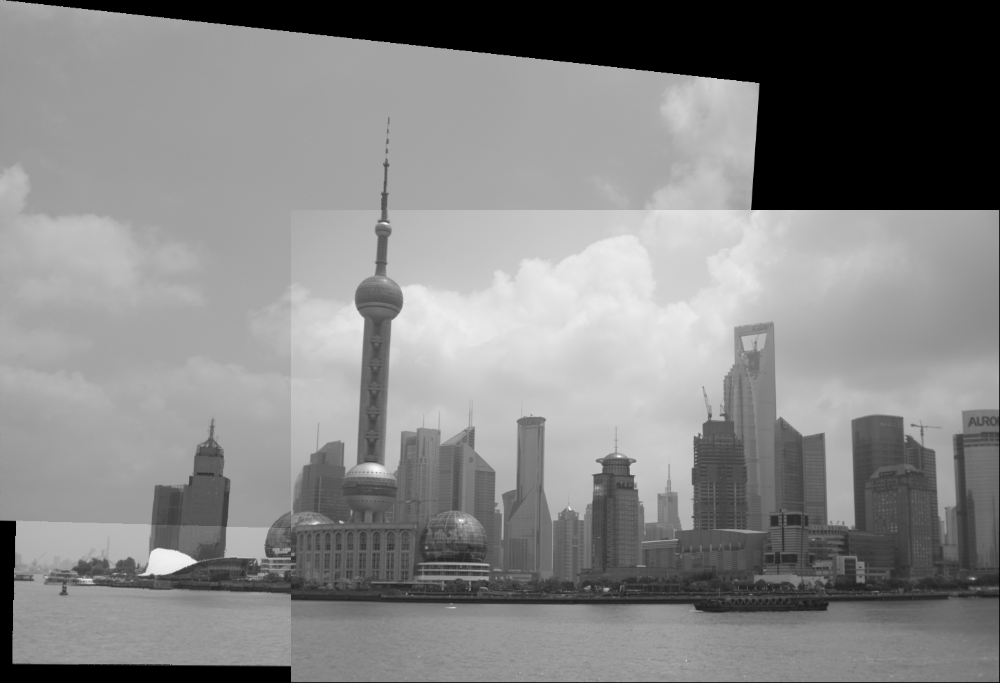

In [ ]:
final = stitch_images(out1,bouns_img_3)
cv2_imshow(final)